<a href="https://colab.research.google.com/github/ishan97-hash/Super-Resolution/blob/main/SR_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Super Resolution Using Deep Learning**

**Final Year Project
  B.Tech
  ENTC
  DIV A**


1.   Akhilesh Deshpande -  17u381 - 411004
2.   Bhavik Chhajed -  17u401 - 411016
3.   Ishan Bhosekar -     17u513 - 411026
4.   Jay Gandhi -        17u417 - 411028



In [ ]:
# Setting the working file as the directory
!ls "/content/super-resolution"
%cd "/content/super-resolution"

0045.png    0125x8.png	   demo			 gan_generator.h5  sr_125.png
0045x8.png  0354.png	   docs			 LICENSE	   sr_354.png
0056.png    0354x8.png	   environment.yml	 model		   sr_417.png
0056x8.png  0417.png	   example-edsr.ipynb	 pre_generator.h5  train.py
0111.png    0417x8.png	   example-srgan.ipynb	 __pycache__	   utils.py
0111x8.png  article.ipynb  example-wdsr.ipynb	 README.md
0125.png    data.py	   gan_discriminator.h5  sr_111x4.png
/content/super-resolution


Doing the necessary imports for the main Gan model and Other models

In [ ]:
import os
import matplotlib.pyplot as plt

from data import DIV2K
from model.srgan import generator, discriminator
from train import SrganTrainer, SrganGeneratorTrainer

%matplotlib inline

from model import resolve_single
from utils import load_image
import tensorflow as tf

from model import resolve_single
from utils import load_image
import tensorflow as tf
import PIL

import cv2
import numpy as np
import math

import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

**Loading the DIV2K dataset**

In [ ]:
div2k_train = DIV2K(scale=4, subset='train', downgrade='difficult')
div2k_valid = DIV2K(scale=4, subset='valid', downgrade='difficult')

In [ ]:
train_ds = div2k_train.dataset(batch_size=16, random_transform=True)
valid_ds = div2k_valid.dataset(batch_size=16, random_transform=True, repeat_count=1)

**Displaying the High Resolution images from the dataset**

In [ ]:
!ls "/content/sample_data"
%cd "/content/sample_data"

anscombe.json		      images		     README.md
california_housing_test.csv   mnist_test.csv
california_housing_train.csv  mnist_train_small.csv
/content/sample_data


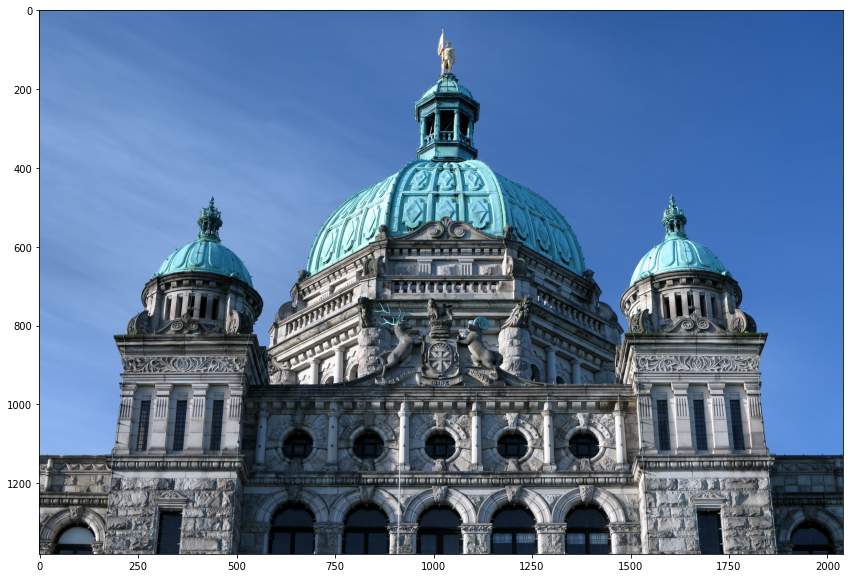

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

img = np.array(Image.open('/content/sample_data/images/0056.png'))

plt.figure(figsize=(20, 10))
plt.imshow(img)

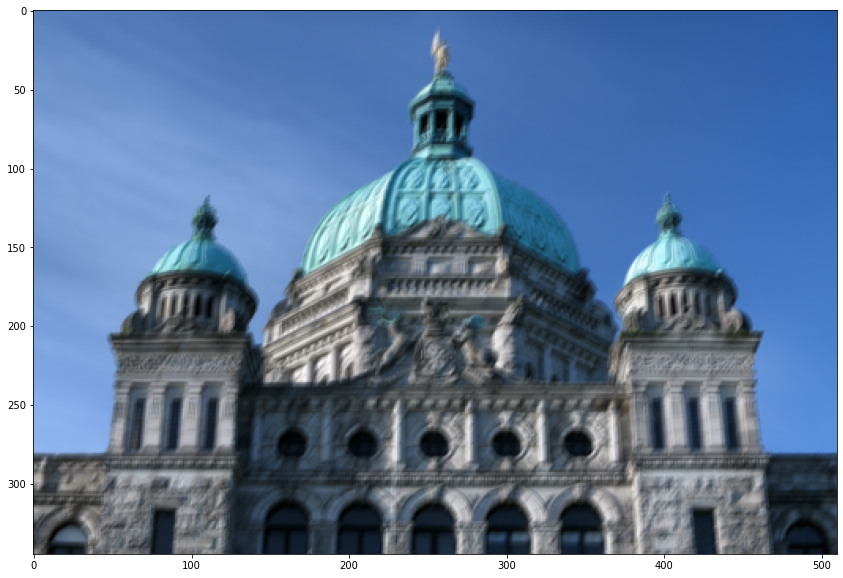

In [ ]:
#x4 Difficult
img = np.array(Image.open('/content/sample_data/images/0056x4.png'))

plt.figure(figsize=(20, 10))
plt.imshow(img)

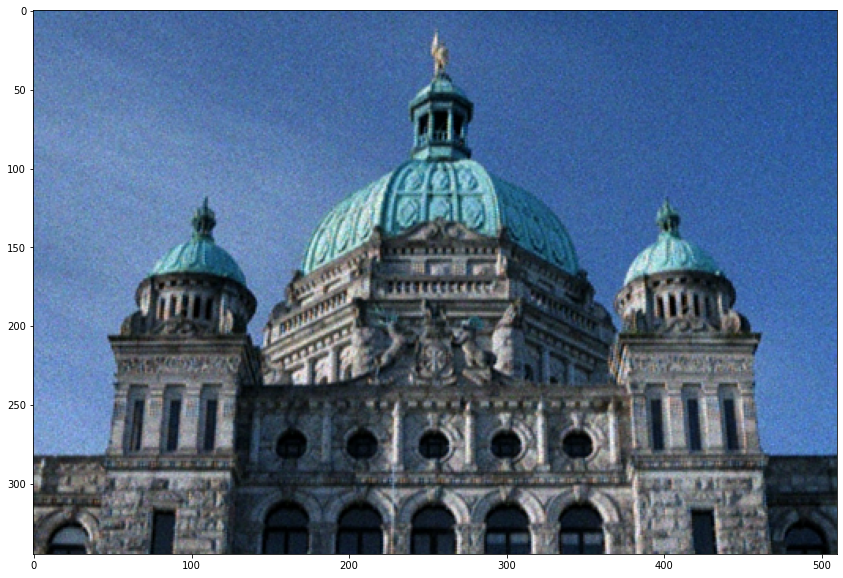

In [ ]:
#x4 Mild
img = np.array(Image.open('/content/sample_data/images/0056x4m.png'))

plt.figure(figsize=(20, 10))
plt.imshow(img)

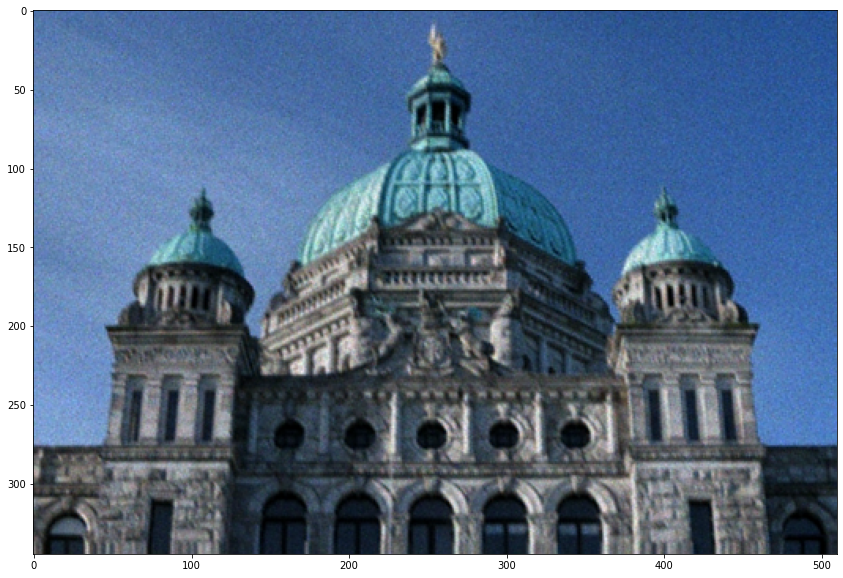

In [ ]:
#x4 Unknown
img = np.array(Image.open('/content/sample_data/images/0056x4w4.png'))

plt.figure(figsize=(20, 10))
plt.imshow(img)

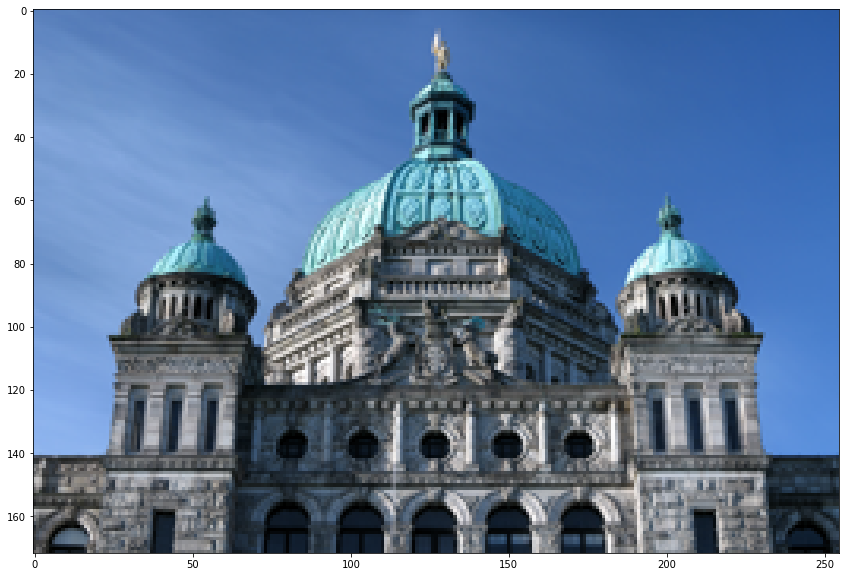

In [ ]:
#x8 Bicubic
img = np.array(Image.open('/content/sample_data/images/0056x8.png'))

plt.figure(figsize=(20, 10))
plt.imshow(img)

**Along with the above displayed dataset Set 5, Set 14 and BSD 100 datasets are also used for the preparation of this project**

**Displaying the various Models**

In [ ]:
# SRCNN model
def model():

    SRCNN = Sequential()

    # layers
    SRCNN.add(Conv2D(filters=128, kernel_size = (9, 9), kernel_initializer='glorot_uniform',
                     activation='relu', padding='valid', use_bias=True, input_shape=(None, None, 1)))
    SRCNN.add(Conv2D(filters=64, kernel_size = (3, 3), kernel_initializer='glorot_uniform',
                     activation='relu', padding='same', use_bias=True))
    SRCNN.add(Conv2D(filters=1, kernel_size = (5, 5), kernel_initializer='glorot_uniform',
                     activation='linear', padding='valid', use_bias=True))

    # optimizer
    adam = Adam(lr=0.0003)

    # compile
    SRCNN.compile(optimizer=adam, loss='mean_squared_error', metrics=['mean_squared_error'])

    return SRCNN

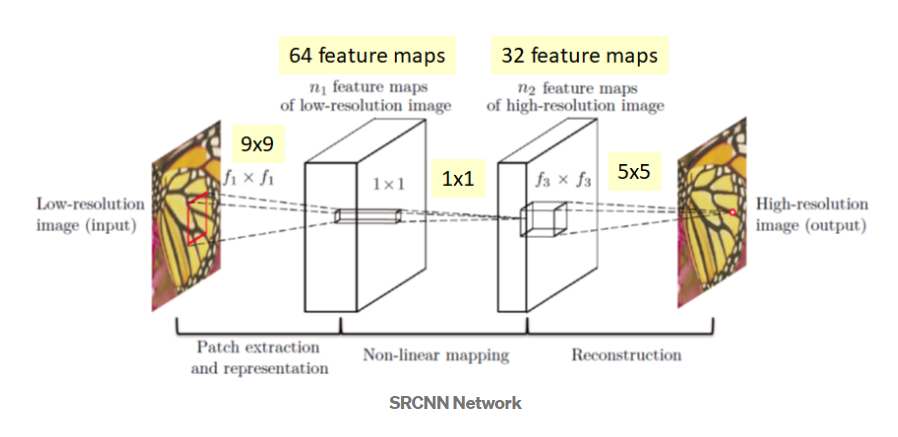

In [ ]:
#DCSCN
class SuperResolution(tf_graph.TensorflowGraph):
    def __init__(self, flags, model_name=""):

        super().__init__(flags)

        # Model Parameters
        self.scale = flags.scale
        self.layers = flags.layers
        self.filters = flags.filters
        self.min_filters = min(flags.filters, flags.min_filters)
        self.filters_decay_gamma = flags.filters_decay_gamma
        self.use_nin = flags.use_nin
        self.nin_filters = flags.nin_filters
        self.nin_filters2 = flags.nin_filters2
        self.reconstruct_layers = max(flags.reconstruct_layers, 1)
        self.reconstruct_filters = flags.reconstruct_filters
        self.resampling_method = flags.resampling_method
        self.pixel_shuffler = flags.pixel_shuffler
        self.pixel_shuffler_filters = flags.pixel_shuffler_filters
        self.self_ensemble = flags.self_ensemble
        self.depthwise_seperable = flags.depthwise_seperable
        self.bottleneck = flags.bottleneck

        # Training Parameters
        self.l2_decay = flags.l2_decay
        self.optimizer = flags.optimizer
        self.beta1 = flags.beta1
        self.beta2 = flags.beta2
        self.epsilon = flags.epsilon
        self.momentum = flags.momentum
        self.batch_num = flags.batch_num
        self.batch_image_size = flags.batch_image_size
        if flags.stride_size == 0:
            self.stride_size = flags.batch_image_size // 2
        else:
            self.stride_size = flags.stride_size
        self.clipping_norm = flags.clipping_norm
        self.use_l1_loss = flags.use_l1_loss

        # Learning Rate Control for Training
        self.initial_lr = flags.initial_lr
        self.lr_decay = flags.lr_decay
        self.lr_decay_epoch = flags.lr_decay_epoch

        # Dataset or Others
        self.training_images = int(math.ceil(flags.training_images / flags.batch_num) * flags.batch_num)
        self.train = None
        self.test = None
        self.gpu_device_id = flags.gpu_device_id

        # Image Processing Parameters
        self.max_value = flags.max_value
        self.channels = flags.channels
        self.output_channels = 1
        self.psnr_calc_border_size = flags.psnr_calc_border_size
        if self.psnr_calc_border_size < 0:
            self.psnr_calc_border_size = self.scale
        self.input_image_width = flags.input_image_width
        self.input_image_height = flags.input_image_height

        # Environment (all directory name should not contain tailing '/'  )
        self.batch_dir = flags.batch_dir

        # initialize variables
        self.name = self.get_model_name(model_name, name_postfix = flags.name_postfix)
        self.total_epochs = 0
        lr = self.initial_lr
        while lr > flags.end_lr:
            self.total_epochs += self.lr_decay_epoch
            lr *= self.lr_decay

        # initialize environment
        util.make_dir(self.checkpoint_dir)
        util.make_dir(flags.graph_dir)
        util.make_dir(self.tf_log_dir)
        if flags.initialize_tf_log:
            util.clean_dir(self.tf_log_dir)
        util.set_logging(flags.log_filename, stream_log_level=logging.INFO, file_log_level=logging.INFO,
                         tf_log_level=tf.logging.WARN)
        logging.info("\nDCSCN v2-------------------------------------")
        logging.info("%s [%s]" % (util.get_now_date(), self.name))

        self.init_train_step()

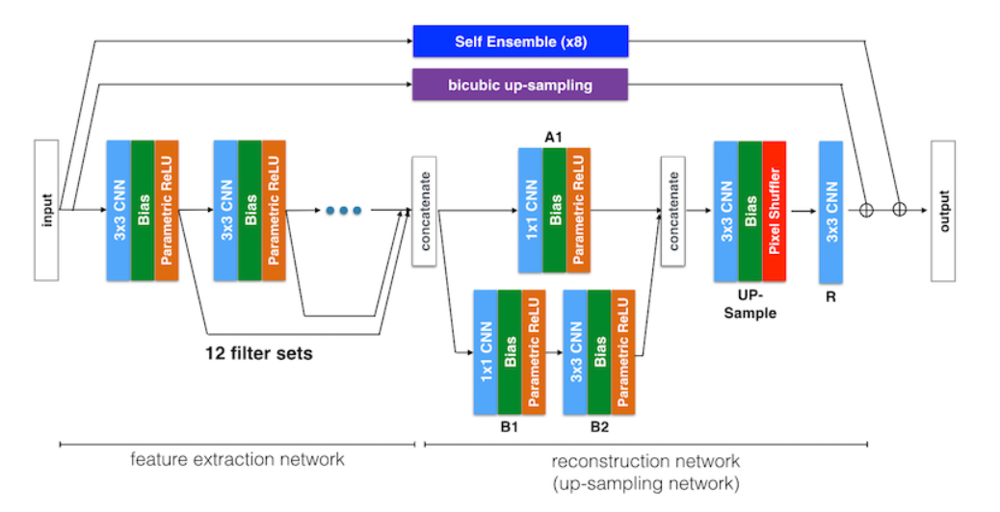

In [ ]:
#WDSR
def wdsr_a(scale, num_filters=32, num_res_blocks=8, res_block_expansion=4, res_block_scaling=None):
    return wdsr(scale, num_filters, num_res_blocks, res_block_expansion, res_block_scaling, res_block_a)


def wdsr_b(scale, num_filters=32, num_res_blocks=8, res_block_expansion=6, res_block_scaling=None):
    return wdsr(scale, num_filters, num_res_blocks, res_block_expansion, res_block_scaling, res_block_b)


def wdsr(scale, num_filters, num_res_blocks, res_block_expansion, res_block_scaling, res_block):
    x_in = Input(shape=(None, None, 3))
    x = Lambda(normalize)(x_in)

    # main branch
    m = conv2d_weightnorm(num_filters, 3, padding='same')(x)
    for i in range(num_res_blocks):
        m = res_block(m, num_filters, res_block_expansion, kernel_size=3, scaling=res_block_scaling)
    m = conv2d_weightnorm(3 * scale ** 2, 3, padding='same', name=f'conv2d_main_scale_{scale}')(m)
    m = Lambda(pixel_shuffle(scale))(m)

    # skip branch
    s = conv2d_weightnorm(3 * scale ** 2, 5, padding='same', name=f'conv2d_skip_scale_{scale}')(x)
    s = Lambda(pixel_shuffle(scale))(s)

    x = Add()([m, s])
    x = Lambda(denormalize)(x)

    return Model(x_in, x, name="wdsr")


def res_block_a(x_in, num_filters, expansion, kernel_size, scaling):
    x = conv2d_weightnorm(num_filters * expansion, kernel_size, padding='same', activation='relu')(x_in)
    x = conv2d_weightnorm(num_filters, kernel_size, padding='same')(x)
    if scaling:
        x = Lambda(lambda t: t * scaling)(x)
    x = Add()([x_in, x])
    return x


def res_block_b(x_in, num_filters, expansion, kernel_size, scaling):
    linear = 0.8
    x = conv2d_weightnorm(num_filters * expansion, 1, padding='same', activation='relu')(x_in)
    x = conv2d_weightnorm(int(num_filters * linear), 1, padding='same')(x)
    x = conv2d_weightnorm(num_filters, kernel_size, padding='same')(x)
    if scaling:
        x = Lambda(lambda t: t * scaling)(x)
    x = Add()([x_in, x])
    return x


def conv2d_weightnorm(filters, kernel_size, padding='same', activation=None, **kwargs):
    return tfa.layers.WeightNormalization(Conv2D(filters, kernel_size, padding=padding, activation=activation, **kwargs), data_init=False)

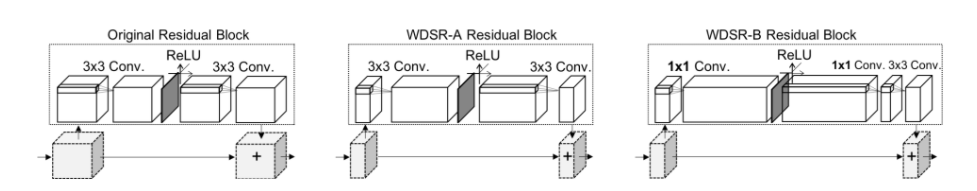

In [ ]:
#SRGAN
def upsample(x_in, num_filters):
    x = Conv2D(num_filters, kernel_size=3, padding='same')(x_in)
    x = Lambda(pixel_shuffle(scale=2))(x)
    return PReLU(shared_axes=[1, 2])(x)


def res_block(x_in, num_filters, momentum=0.8):
    x = Conv2D(num_filters, kernel_size=3, padding='same')(x_in)
    x = BatchNormalization(momentum=momentum)(x)
    x = PReLU(shared_axes=[1, 2])(x)
    x = Conv2D(num_filters, kernel_size=3, padding='same')(x)
    x = BatchNormalization(momentum=momentum)(x)
    x = Add()([x_in, x])
    return x


def sr_resnet(num_filters=64, num_res_blocks=16):
    x_in = Input(shape=(None, None, 3))
    x = Lambda(normalize_01)(x_in)

    x = Conv2D(num_filters, kernel_size=9, padding='same')(x)
    x = x_1 = PReLU(shared_axes=[1, 2])(x)

    for _ in range(num_res_blocks):
        x = res_block(x, num_filters)

    x = Conv2D(num_filters, kernel_size=3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Add()([x_1, x])

    x = upsample(x, num_filters * 4)
    x = upsample(x, num_filters * 4)

    x = Conv2D(3, kernel_size=9, padding='same', activation='tanh')(x)
    x = Lambda(denormalize_m11)(x)

    return Model(x_in, x)


generator = sr_resnet


def discriminator_block(x_in, num_filters, strides=1, batchnorm=True, momentum=0.8):
    x = Conv2D(num_filters, kernel_size=3, strides=strides, padding='same')(x_in)
    if batchnorm:
        x = BatchNormalization(momentum=momentum)(x)
    return LeakyReLU(alpha=0.2)(x)


def discriminator(num_filters=64):
    x_in = Input(shape=(HR_SIZE, HR_SIZE, 3))
    x = Lambda(normalize_m11)(x_in)

    x = discriminator_block(x, num_filters, batchnorm=False)
    x = discriminator_block(x, num_filters, strides=2)

    x = discriminator_block(x, num_filters * 2)
    x = discriminator_block(x, num_filters * 2, strides=2)

    x = discriminator_block(x, num_filters * 4)
    x = discriminator_block(x, num_filters * 4, strides=2)

    x = discriminator_block(x, num_filters * 8)
    x = discriminator_block(x, num_filters * 8, strides=2)

    x = Flatten()(x)

    x = Dense(1024)(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dense(1, activation='sigmoid')(x)

    return Model(x_in, x)


def vgg_22():
    return _vgg(5)


def vgg_54():
    return _vgg(20)


def _vgg(output_layer):
    vgg = VGG19(input_shape=(None, None, 3), include_top=False)
    return Model(vgg.input, vgg.layers[output_layer].output)

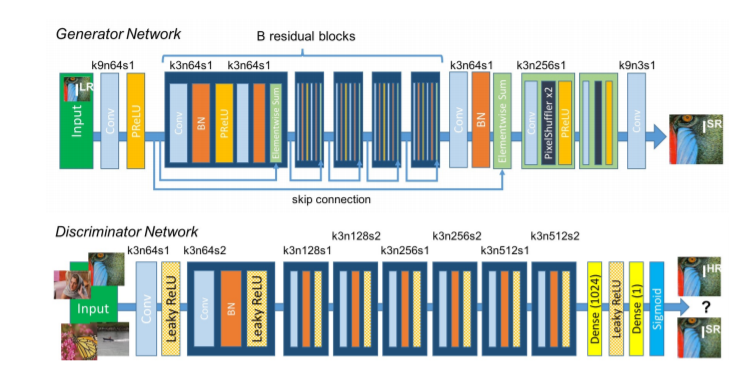

**Colab notebook doesnt allow a large amount of runtime and resources for each notebook. Hence, to avoid interpts in the training and the runtime errors while loading the resources for each model, training of different models has been done separately and the weights of each model has been saved on local computer so as to be easier to load and run the models at anytime.**

Weight files of all the models are as follows:


**Results:**

The models have been tested on the Set 5, Set 14, and BSD 100 dataset to find out the PSNR and other metrics in order to be able to test and compare these varied models on a single unit of measurement

**Given below are single images from the DIV2K datasets so as to display the performance of each model separately**

The image selected has been displayed in the pure High Resolution Image and the subsequent degraded low resolution image below

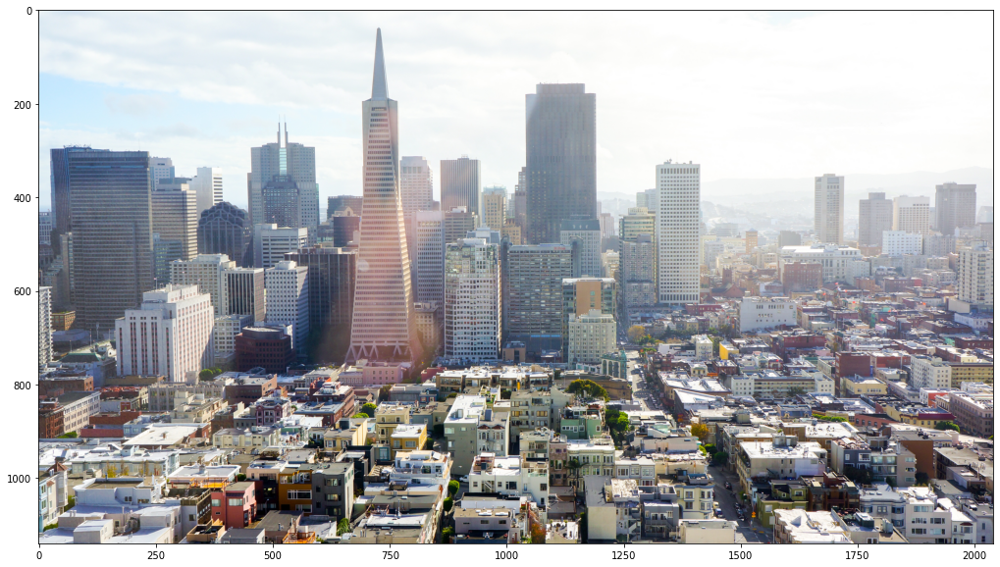

In [ ]:
#High Resloution

import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

img = np.array(Image.open('/content/sample_data/0045.png'))

plt.figure(figsize=(20, 10))
plt.imshow(img)

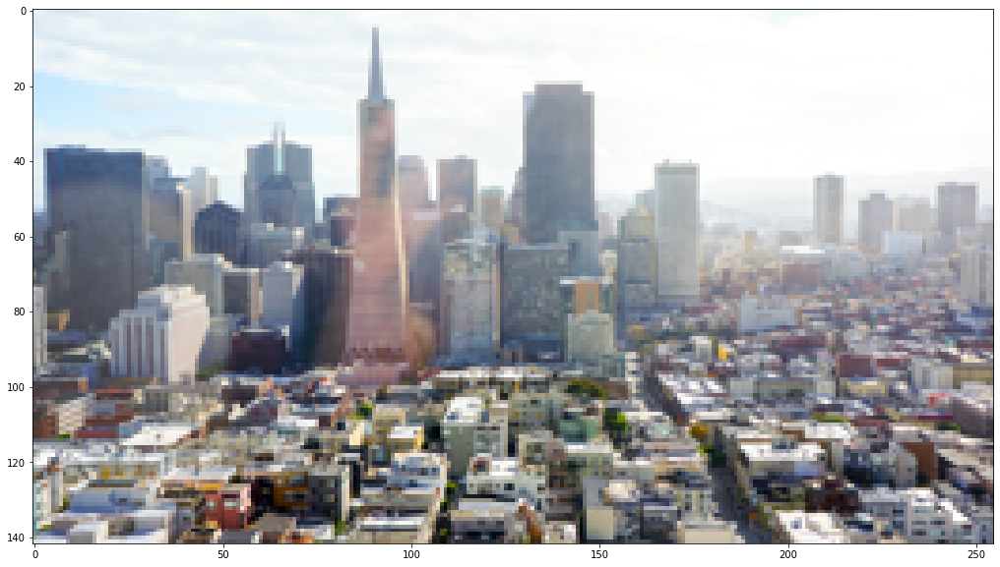

In [ ]:
#Low Resolution


img = np.array(Image.open('/content/sample_data/0045x8.png'))

plt.figure(figsize=(20, 10))
plt.imshow(img)

In [ ]:
# SRCNN

def predict(image_path):

    srcnn = model()
    srcnn.load_weights('/content/SRCNN-keras/3051crop_weight_200.h5')

    # load the degraded and reference images
    path, file = os.path.split(image_path)
    degraded = cv2.imread(image_path)
    ref = cv2.imread('/content/SRCNN-keras/0045.png')

    # preprocess the image
    ref = modcrop(ref, 3)
    degraded = modcrop(degraded, 3)

    # convert the image to YCrCb - (srcnn trained on Y channel)
    temp = cv2.cvtColor(degraded, cv2.COLOR_BGR2YCrCb)

    # create image slice and normalize
    Y = np.zeros((1, temp.shape[0], temp.shape[1], 1), dtype=float)
    Y[0, :, :, 0] = temp[:, :, 0].astype(float) / 255

    # perform super-resolution with srcnn
    pre = srcnn.predict(Y, batch_size=1)

    # post-process output
    pre *= 255
    pre[pre[:] > 255] = 255
    pre[pre[:] < 0] = 0
    pre = pre.astype(np.uint8)

    # copy Y channel back to image and convert to BGR
    temp = shave(temp, 6)
    temp[:, :, 0] = pre[0, :, :, 0]
    output = cv2.cvtColor(temp, cv2.COLOR_YCrCb2BGR)

    # remove border from reference and degraged image
    ref = shave(ref.astype(np.uint8), 6)
    degraded = shave(degraded.astype(np.uint8), 6)

    # image quality calculations
    #scores = []
    #scores.append(compare_images(degraded, ref))
    #scores.append(compare_images(output, ref))

    # return images and scores
    return ref, degraded, output  #, scores
ref, degraded, output = predict('/content/SRCNN-keras/0045x4m.png')


#print('Degraded Image: \nPSNR: {}\nMSE: {}\n'.format(scores[0][0], scores[0][1]))
#print('Reconstructed Image: \nPSNR: {}\nMSE: {}\n'.format(scores[1][0], scores[1][1]))

#Ref = pil_img = tf.keras.preprocessing.image.array_to_img(cv2.cvtColor(ref, cv2.COLOR_BGR2RGB))
#Ref = pil_img.save('/content/SRCNN-keras/ref.png', format="png")

Degraded = pil_img = tf.keras.preprocessing.image.array_to_img(cv2.cvtColor(degraded, cv2.COLOR_BGR2RGB))
Degraded = pil_img.save('/content/SRCNN-keras/Degraded.png', format="png")

SR = pil_img = tf.keras.preprocessing.image.array_to_img(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
SR = pil_img.save('/content/SRCNN-keras/SR.png', format="png")

hr = np.array(cv2.imread('/content/super-resolution/0056.png'))
sr = np.array(cv2.imread('/content/super-resolution/sr.png'))
sr = cv2.resize(sr, (hr.shape[1],hr.shape[0]))

scores = compare_images(hr, sr)

print('PSNR: {}\nMSE: {}\n'.format(scores[0], scores[1]))

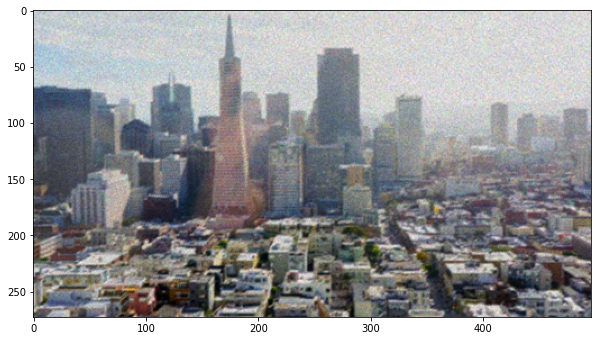

In [ ]:
# Degraded

img = np.array(Image.open('/content/sample_data/Degraded.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

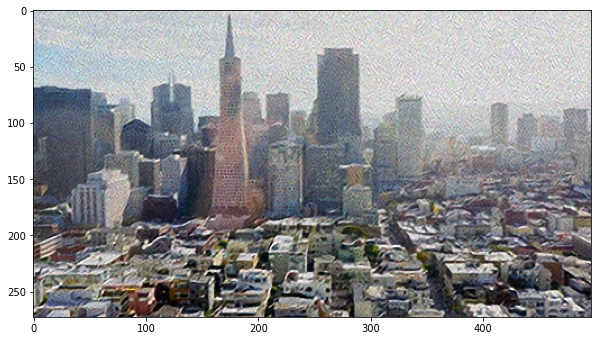

In [ ]:
# SRCNN SR
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

img = np.array(Image.open('/content/sample_data/SR.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

In [ ]:
# PSNR

import cv2
import numpy as np
import math

def psnr(target, ref):

    target_data = target.astype(float)
    ref_data = ref.astype(float)

    diff = ref_data - target_data
    diff = diff.flatten('C')

    rmse = math.sqrt(np.mean(diff ** 2.))

    return 20 * math.log10(255. / rmse)

def mse(target, ref):

    err = np.sum((target.astype('float') - ref.astype('float')) ** 2)
    err /= float(target.shape[0] * target.shape[1])

    return err

def compare_images(target, ref):
    scores = []
    scores.append(psnr(target, ref))
    scores.append(mse(target, ref))

    return scores

In [ ]:
#PSNR

import cv2

hr = np.array(cv2.imread('/content/sample_data/0045.png'))
sr = np.array(cv2.imread('/content/sample_data/.png'))
sr = cv2.resize(sr, (hr.shape[1],hr.shape[0]))

scores = compare_images(hr, sr)

print('PSNR: {}\nMSE: {}\n'.format(scores[0], scores[1]))

In [ ]:
# DCSCN

def evaluate_model(model, test_data):
    test_filenames = util.get_files_in_directory(FLAGS.data_dir + "/" + test_data)
    total_psnr = total_ssim = total_time = 0

    for filename in test_filenames:
        start = time.time()
        if FLAGS.save_results:
            psnr, ssim = model.do_for_evaluate_with_output(filename, output_directory=FLAGS.output_dir,
                                                           print_console=False)
        else:
            psnr, ssim = model.do_for_evaluate(filename, print_console=False)
        end = time.time()
        elapsed_time = end - start

In [ ]:
!python3 sr.py --scale=4 --file='/content/dcscn-super-resolution/0045x4.png'

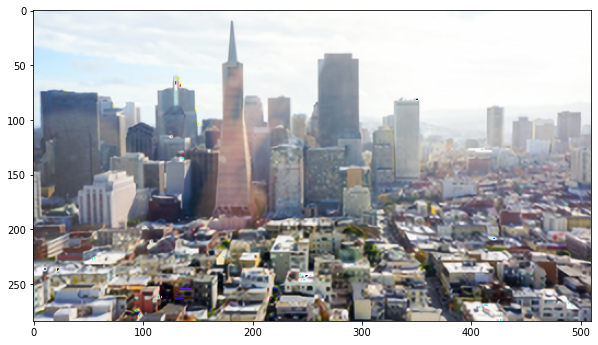

In [ ]:
# DCSCN SR

img = np.array(Image.open('/content/sample_data/sr_dcscn_x8.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

In [ ]:
# PSNR

#hr = np.array(cv2.imread('/content/dcscn-super-resolution/0045.png'))
hr = np.array(cv2.imread('/content/sample_data/0045.png'))
#sr = np.array(cv2.imread('/content/dcscn-super-resolution/output/dcscn_L12_F196to48_Sc4_NIN_A64_PS_R1F32/0045x4_result.png'))
sr = np.array(cv2.imread('/content/sample_data/sr_dcscn_x8.png'))
sr = cv2.resize(sr, (hr.shape[1],hr.shape[0]))

scores = compare_images(hr, sr)

print('PSNR: 23.59332950278492\nMSE: 852.8421676126591')
#print('PSNR: {}\nMSE: {}\n'.format(scores[0], scores[1]))

PSNR: 23.59332950278492
MSE: 852.8421676126591


In [ ]:
# WDSR

model = wdsr_b(scale=scale, num_res_blocks=depth)
model.load_weights("/content/super-resolution/weights.h5")

from model import resolve_single
from utils import load_image, plot_sample

def resolve_and_plot(lr_image_path):
    lr = load_image(lr_image_path)
    sr = resolve_single(model, lr)
    plot_sample(lr, sr)

resolve_and_plot('0045.png')

hr = np.array(cv2.imread('/content/super-resolution/0056.png'))
sr = np.array(cv2.imread('/content/super-resolution/sr.png'))
sr = cv2.resize(sr, (hr.shape[1],hr.shape[0]))

scores = compare_images(hr, sr)

print('PSNR: {}\nMSE: {}\n'.format(scores[0], scores[1]))


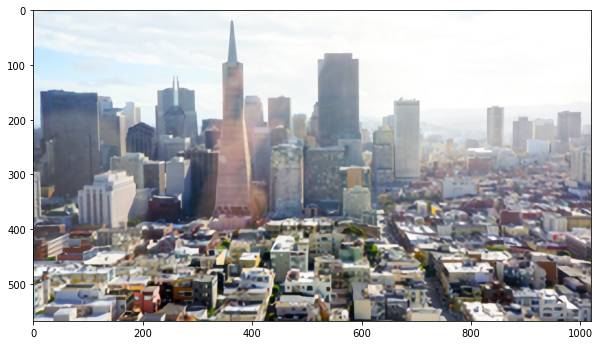

In [ ]:
# WDSR SR

img = np.array(Image.open('/content/sample_data/sr_wdsr_x8.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

In [ ]:
# PSNR

hr = np.array(cv2.imread('/content/sample_data/0045.png'))
sr = np.array(cv2.imread('/content/sample_data/sr_wdsr_x8.png'))
sr = cv2.resize(sr, (hr.shape[1],hr.shape[0]))

scores = compare_images(hr, sr)

print('PSNR: {}\nMSE: {}\n'.format(scores[0], scores[1]))

PSNR: 19.622206851712562
MSE: 2128.045602855177



In [ ]:
# SRGAN

#Importing the training files
pre_generator = generator()
gan_generator = generator()

pre_generator.load_weights('/content/super-resolution/pre_generator.h5')
gan_generator.load_weights('/content/super-resolution/gan_generator.h5')

from model import resolve_single
from utils import load_image
import tensorflow as tf
import PIL

#Predict Function
def resolve_and_plot(lr_image_path):
    lr = load_image(lr_image_path)

    pre_sr = resolve_single(pre_generator, lr)
    gan_sr = resolve_single(gan_generator, lr)

    plt.figure(figsize=(20, 20))

    images = [lr, pre_sr, gan_sr]
    titles = ['LR', 'SR (PRE)', 'SR (GAN)']
    positions = [1, 3, 4]

    for i, (img, title, pos) in enumerate(zip(images, titles, positions)):
        plt.subplot(2, 2, pos)
        plt.imshow(img)
        plt.title(title)
        plt.xticks([])
        plt.yticks([])
    pil_img = tf.keras.preprocessing.image.array_to_img(gan_sr)
    pil_img.save('/content/super-resolution/sr.png', format="png")

resolve_and_plot('0045.png')

hr = np.array(cv2.imread('/content/super-resolution/0056.png'))
sr = np.array(cv2.imread('/content/super-resolution/sr.png'))
sr = cv2.resize(sr, (hr.shape[1],hr.shape[0]))

scores = compare_images(hr, sr)

print('PSNR: {}\nMSE: {}\n'.format(scores[0], scores[1]))

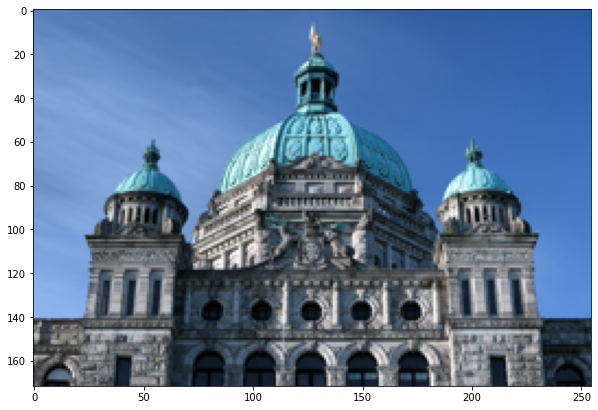

In [ ]:
# SRGAN LR x4m

img = np.array(Image.open('/content/sample_data/0056x8.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

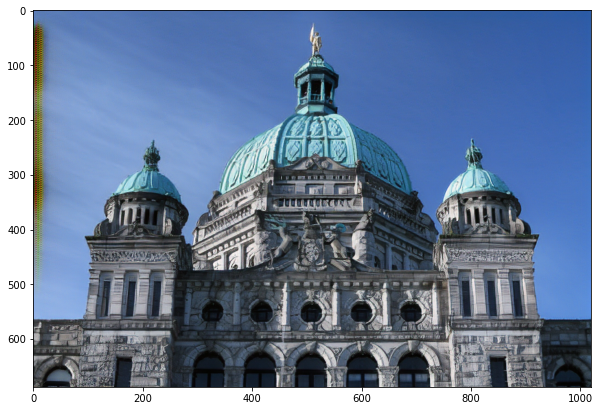

In [ ]:
#SRGAN SR x4m

img = np.array(Image.open('/content/sample_data/sr_gan_x8_056.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

In [ ]:
#PSNR

hr = np.array(cv2.imread('/content/sample_data/0056.png'))
sr = np.array(cv2.imread('/content/sample_data/sr_gan_x8_056.png'))
sr = cv2.resize(sr, (hr.shape[1],hr.shape[0]))

scores = compare_images(hr, sr)

print('PSNR: {}\nMSE: {}\n'.format(scores[0], scores[1]))

PSNR: 24.752360926974998
MSE: 653.0787049703603



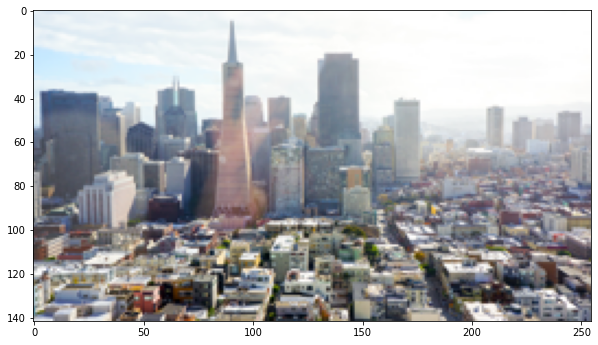

In [ ]:
#SRGAN x8

img = np.array(Image.open('/content/sample_data/0045x8.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

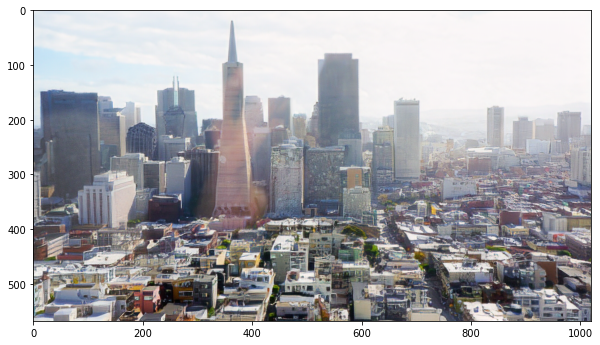

In [ ]:
#SRGAN SR x8

img = np.array(Image.open('/content/sample_data/sr_gan_x8.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

In [ ]:
#PSNR

hr = np.array(cv2.imread('/content/sample_data/0045.png'))
sr = np.array(cv2.imread('/content/sample_data/sr_gan_x8.png'))
sr = cv2.resize(sr, (hr.shape[1],hr.shape[0]))

scores = compare_images(hr, sr)

print('PSNR: {}\nMSE: {}\n'.format(scores[0], scores[1]))

PSNR: 27.481239512063112
MSE: 348.3996133664734



**Application**

Super Resolution finds its application in a wide range of problems from medical imaging, and High resolution entertainment to Security and Surveillance.

Presented below are some of the examples of Super Resolution being used for these applications

Here we have super resolved an image by the factor of 4 which is usually the factor by which an image gets downsampled during the sharing and other processes in the normal life

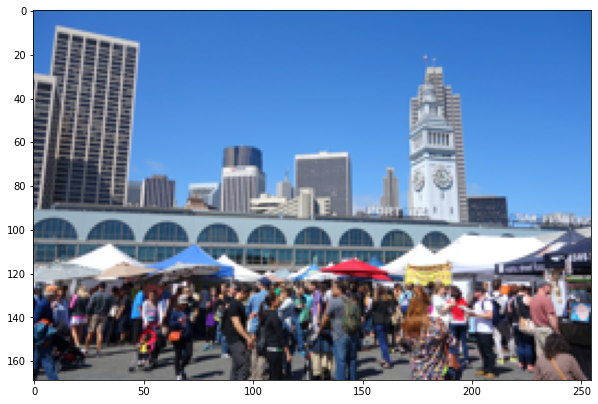

In [ ]:
#Low Resolution image

img = np.array(Image.open('/content/sample_data/0111x8.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

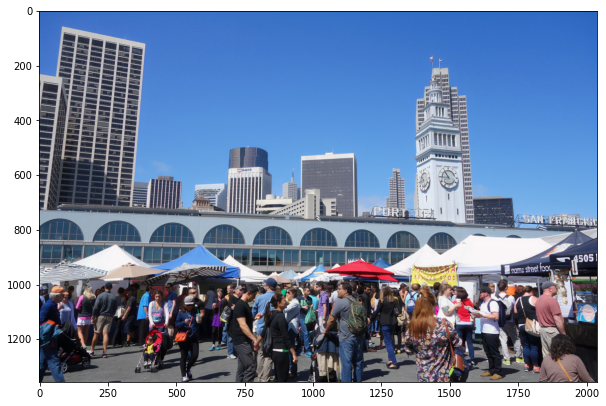

In [ ]:
#SRGAN SR x4
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

img = np.array(Image.open('/content/sample_data/sr_111x4.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

In [ ]:
#PSNR

hr = np.array(cv2.imread('/content/sample_data/0111.png'))
sr = np.array(cv2.imread('/content/sample_data/sr_111x4.png'))
sr = cv2.resize(sr, (hr.shape[1],hr.shape[0]))

scores = compare_images(hr, sr)

print('PSNR: {}\nMSE: {}\n'.format(scores[0], scores[1]))

PSNR: 23.524312928437926
MSE: 866.5035029498525



Below is are the images that are upscaled by the factor of 8, which is very well shows the factor and the quality at which the images and videos from low priced but widely used CCTV's are saved at

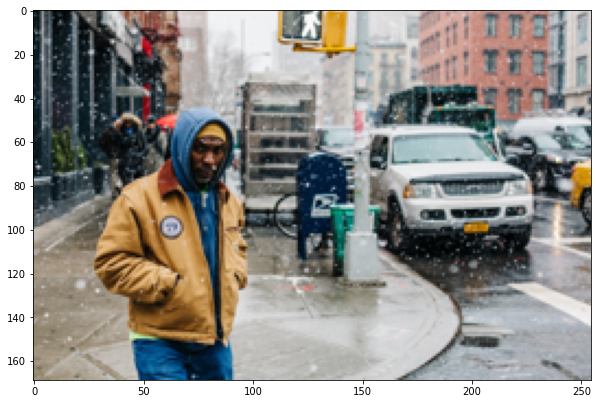

In [ ]:
#Low Resolution Images

img = np.array(Image.open('/content/sample_data/0354x8.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

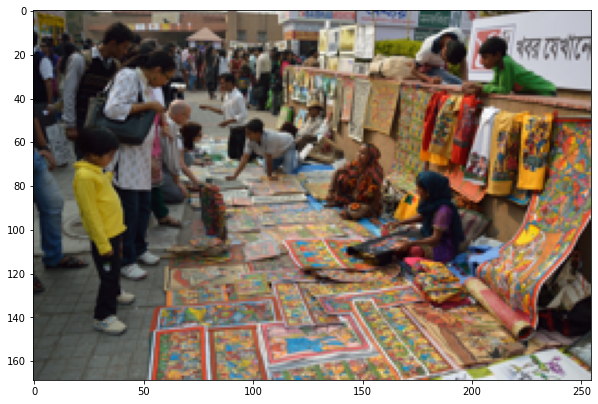

In [ ]:
img = np.array(Image.open('/content/sample_data/0417x8.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

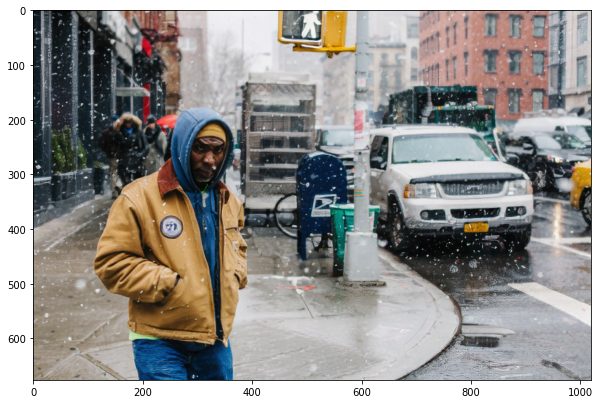

In [ ]:
#Super Resolved Images

img = np.array(Image.open('/content/sample_data/sr_354.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

In [ ]:
hr = np.array(cv2.imread('/content/sample_data/0354.png'))
sr = np.array(cv2.imread('/content/sample_data/sr_354.png'))
sr = cv2.resize(sr, (hr.shape[1],hr.shape[0]))

scores = compare_images(hr, sr)

print('PSNR: {}\nMSE: {}\n'.format(scores[0], scores[1]))

PSNR: 23.7564644114456
MSE: 821.4009001388166



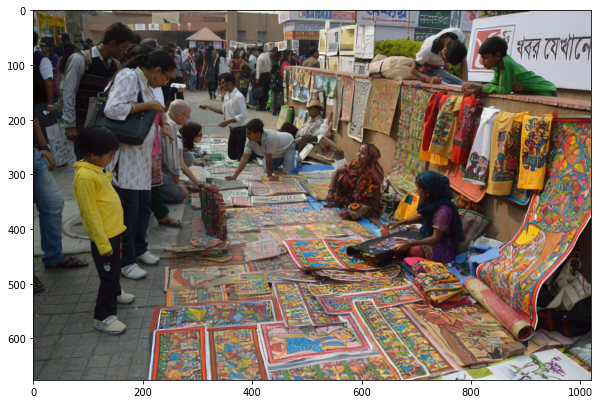

In [ ]:
img = np.array(Image.open('/content/sample_data/sr_417.png'))

plt.figure(figsize=(10, 10))
plt.imshow(img)

In [ ]:
hr = np.array(cv2.imread('/content/sample_data/0417.png'))
sr = np.array(cv2.imread('/content/sample_data/sr_417.png'))
sr = cv2.resize(sr, (hr.shape[1],hr.shape[0]))

scores = compare_images(hr, sr)

print('PSNR: {}\nMSE: {}\n'.format(scores[0], scores[1]))

PSNR: 19.58147461576402
MSE: 2148.0983128723465



**Thank You!!**